In [ ]:
!pip install opencv-python

In [ ]:
!pip install dlib

In [ ]:
import cv2
import dlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Carregando e convertendo imagem em RGB para que o matplotlib plote com as cores corretas

In [ ]:
imagem = cv2.imread('/content/drive/MyDrive/Alura/ML_Avançada/Visão Computacional/Arq_imagens/px-people.jpg')
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

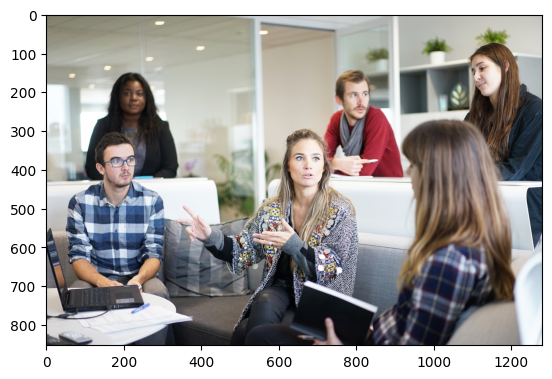

In [ ]:
plt.imshow(imagem)

### O classificador trabalha com imagem em escala de cinza. Temos que converter

In [ ]:
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)

###Carregando o modelo treinado para faces humana haar cascade. Disponível no repositório Opencv no Github
- https://github.com/opencv/opencv/tree/4.x/data/haarcascades

- O classificador Haar cascade ...

In [ ]:
classificador = cv2.CascadeClassifier('/content/drive/MyDrive/Alura/ML_Avançada/Visão Computacional/classificadores/haarcascade_frontalface_default.xml')

- Parâmetro 1.3: diminui a imagem para reconhecer melhor os detalhes da imagem. Nesse caso está diminuindo em 30%
- Parâmetro 5: Número mínimo de caracteristicas vizinhas que o haar cascade vai considerar

In [ ]:
faces = classificador.detectMultiScale(imagem_gray, 1.3, 5)
len(faces) #quantos rostos detectados

5

### Para fazer a região de interesse da imagem, o mais facil e converter de volta para imagem colorida. No nosso caso, a região de interesse é a facial, então vamos anotá-las

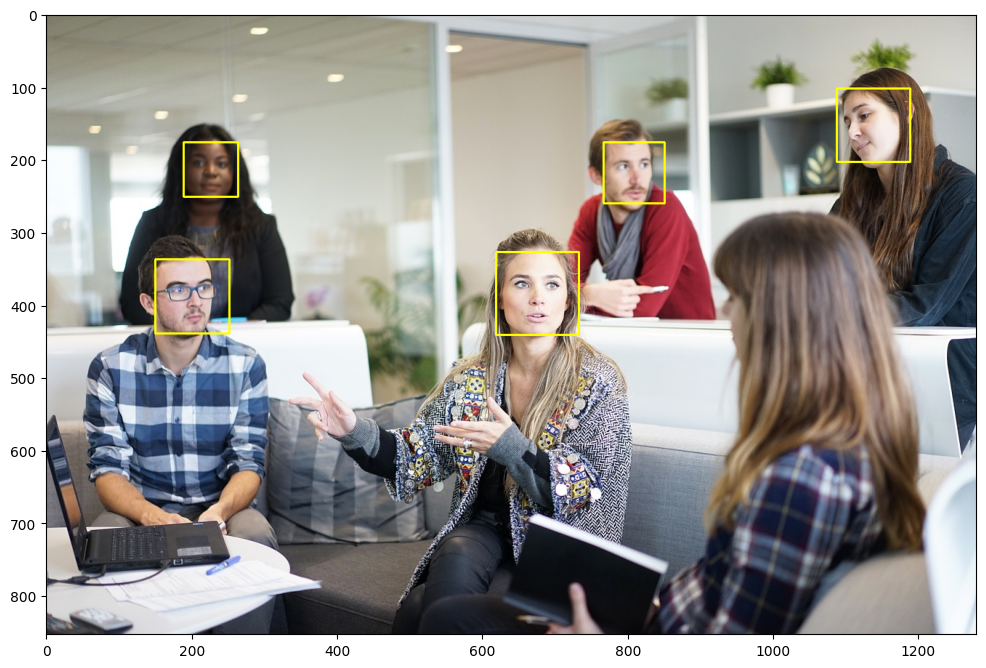

In [ ]:
imagem_anotada = imagem.copy()
#eixo x, eixo y, largura, altura
for (x, y, w, h) in faces:                             #cor      #espessura
  cv2.rectangle(imagem_anotada, (x, y), (x+w, y+h), (255, 255, 0), 2)

plt.figure(figsize=(12,10))
plt.imshow(imagem_anotada)

### Criando um contador de faces. Para cada face que identificar, será armazenado uma imagem para ela

In [ ]:
#roi = region of interess
face_imagem = 0
for (x, y, w, h) in faces:
  face_imagem  += 1
  imagem_roi = imagem[y:y+h, x:x+w] #recortando a imagem
  imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR) #convertendo cores
  cv2.imwrite("face_" + str(face_imagem) + ".png", imagem_roi) #criando arquivo

##Agora será realizado a identificação de faces de um dataset de fotos de alunos da faculdade Georgia Tech.

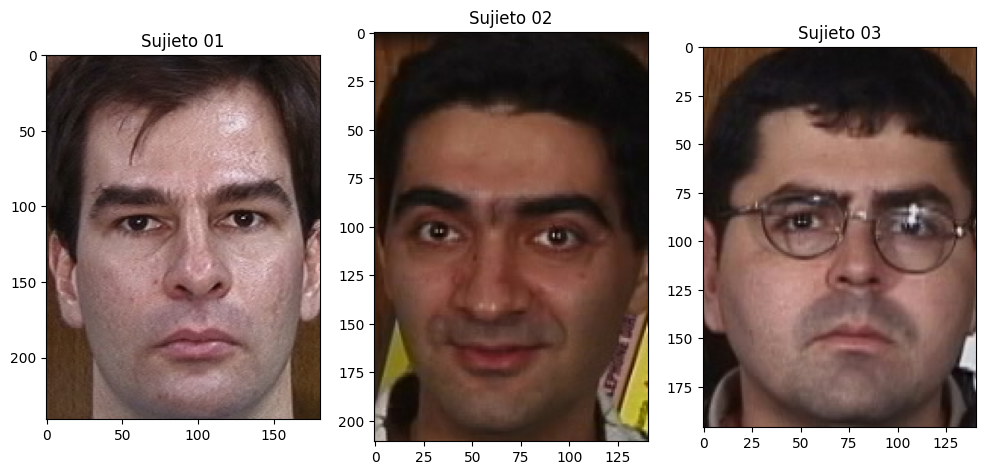

In [ ]:
imagem_face1 = cv2.imread("/content/drive/MyDrive/Alura/ML_Avançada/Visão Computacional/Arq_imagens/s01_01.jpg")
imagem_face1 = cv2.cvtColor(imagem_face1, cv2.COLOR_BGR2RGB)

imagem_face2 = cv2.imread("/content/drive/MyDrive/Alura/ML_Avançada/Visão Computacional/Arq_imagens/s02_01.jpg")
imagem_face2 = cv2.cvtColor(imagem_face2, cv2.COLOR_BGR2RGB)

imagem_face3 = cv2.imread("/content/drive/MyDrive/Alura/ML_Avançada/Visão Computacional/Arq_imagens/s03_01.jpg")
imagem_face3 = cv2.cvtColor(imagem_face3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 10))
plt.subplot(131)
plt.title("Sujieto 01")
plt.imshow(imagem_face1)
plt.subplot(132)
plt.title("Sujieto 02")
plt.imshow(imagem_face2)
plt.subplot(133)
plt.title("Sujieto 03")
plt.imshow(imagem_face3)
plt.show()

#Normalizando imagem de treino e de teste do dataset para que fiquem do mesmo tamanho
- O modelo só trabalha de forma correta se as imagens estiverem na mesma escala

In [ ]:
from os import listdir, path, makedirs
from os.path import isfile, join

import shutil

faces_caminho = "/content/drive/MyDrive/Alura/ML_Avançada/Visão Computacional/Arq_imagens/imagens/cropped_faces/"
lista_arq_faces = [f for f in listdir(faces_caminho) if isfile(join(faces_caminho, f))]

In [ ]:
faces_path_treino = "imagens/treino/"
faces_path_teste = "imagens/teste/"

if not path.exists(faces_path_treino):
    makedirs(faces_path_treino)

if not path.exists(faces_path_teste):
    makedirs(faces_path_teste)

for arq in lista_arq_faces:
    sujeito = arq[1:3]
    numero = arq[4:6]

    if int(numero) <= 10:
        shutil.copyfile(faces_caminho + arq, faces_path_treino + arq)
    else:
        shutil.copyfile(faces_caminho + arq, faces_path_teste + arq)

### Função para redimensionar as imagens para uma mesma escala e colocar na escala de cinza

In [ ]:
def padronizar_imagem(imagem_caminho):
  imagem = cv2.imread(imagem_caminho, cv2.IMREAD_GRAYSCALE)
  imagem = cv2.resize(imagem, (200, 200), interpolation = cv2.INTER_LANCZOS4)
  return imagem

In [ ]:
lista_faces_treino = [f for f in listdir(faces_path_treino) if isfile(join(faces_path_treino, f))]
lista_faces_teste = [f for f in listdir(faces_path_teste) if isfile(join(faces_path_teste, f))]

In [ ]:
lista_faces_treino[0]

's32_02.jpg'

In [ ]:
lista_faces_teste[0]

's06_14.jpg'

### Loop para pegar os arquivos e passar para a função de padronização para os dados de treino

In [ ]:
dados_treinamento = []
sujeitos = []

for i, arq in enumerate(lista_faces_treino):
  imagem_path = faces_path_treino + arq
  imagem = padronizar_imagem(imagem_path)
  dados_treinamento.append(imagem)
  sujeito = arq[1:3]
  sujeitos.append(int(sujeito))

In [ ]:
print(len(dados_treinamento))
print(len(sujeitos))

500
500


- 500 dados para treino

### Loop para pegar os arquivos e passar para a função de padronização para os dados de teste

In [ ]:
dados_teste = []
sujeitos_teste = []

for i, arq in enumerate(lista_faces_teste):
  imagem_path = faces_path_teste + arq
  imagem = padronizar_imagem(imagem_path)
  dados_teste.append(imagem)
  sujeito = arq[1:3]
  sujeitos_teste.append(int(sujeito))

In [ ]:
print(len(dados_teste))
print(len(sujeitos_teste))

250
250


250 dados para teste

Text(0.5, 1.0, '32')

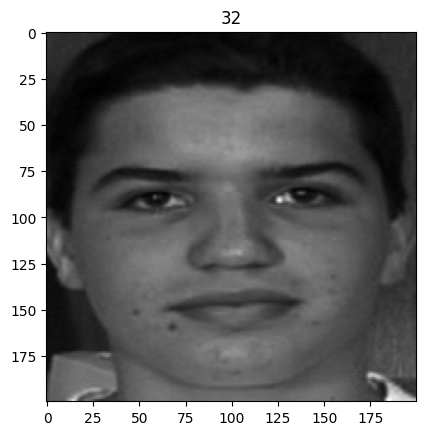

In [ ]:
plt.imshow(dados_treinamento[0], cmap='gray')
plt.title(sujeitos[0])

Text(0.5, 1.0, '6')

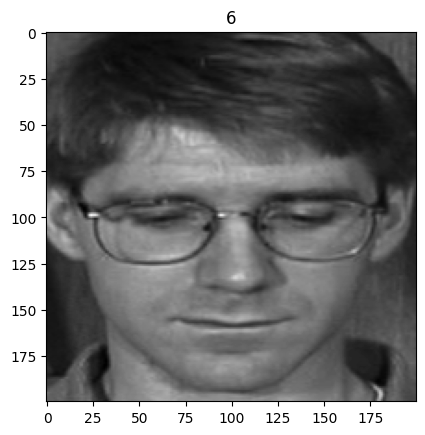

In [ ]:
plt.imshow(dados_teste[0], cmap='gray')
plt.title(sujeitos_teste[0])

#Algoritmos de classificações de faces

###Covertendo a lista de sujeitos num array

In [ ]:
import numpy as np

sujeitos = np.asarray(sujeitos, dtype = np.int32)
sujeitos_teste = np.asarray(sujeitos_teste, dtype = np.int32)

#Algoritmo Eingenface
- O termo "Eigenfaces" refere-se a um conjunto de componentes principais (eigenvectors) que são extraídos de um grande conjunto de imagens faciais. Esses componentes principais capturam as variações mais significativas nas imagens faciais.

### Etapas de funcionamento:
- **Construção da Matriz de Dados:** As imagens de treinamento são transformadas em vetores e organizadas em uma matriz de dados.
- **Cálculo da Média:** Calcula-se a média de todas as imagens de treinamento.
- **Subtração da Média:** A média é subtraída de cada imagem, centralizando os dados.
- **Cálculo da Matriz de Covariância:** Calcula-se a matriz de covariância das imagens centralizadas.
- **Cálculo dos Eigenfaces:** A decomposição de valores singulares (SVD) é usada para encontrar os eigenvectors (eigenfaces) da matriz de covariância.
- **Projeção em Espaço de Eigenfaces:** As imagens de treinamento são projetadas no espaço definido pelos eigenfaces, resultando em um conjunto de coeficientes.
- **Reconhecimento Facial:** Para reconhecer uma nova imagem, ela é projetada no espaço de eigenfaces e comparada com as projeções das imagens de treinamento. A imagem de treinamento mais próxima é identificada como a correspondente.

In [ ]:
modelo_eingenfaces = cv2.face.EigenFaceRecognizer_create()

modelo_eingenfaces.train(dados_treinamento, sujeitos)

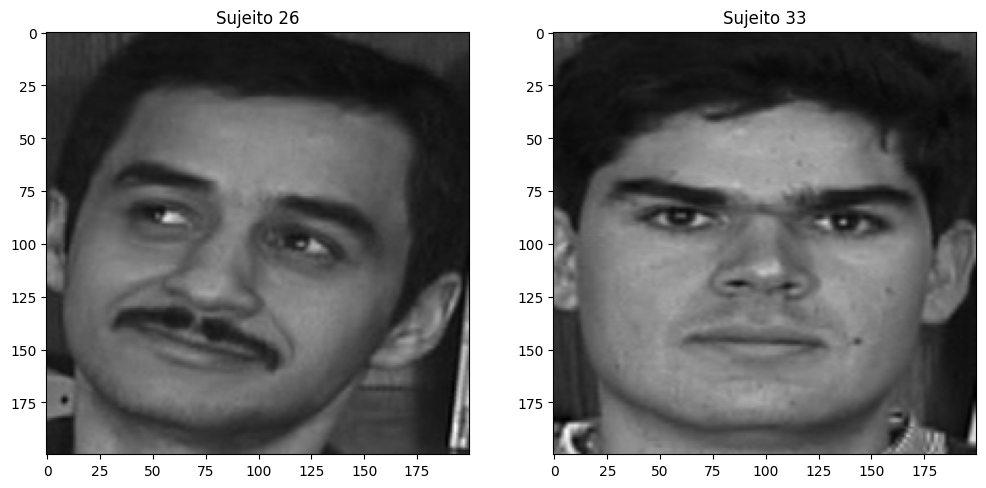

In [ ]:
plt.figure(figsize=(12, 10))
plt.subplot(121)
plt.title("Sujeito " + str(sujeitos_teste[5]))
plt.imshow(dados_teste[6], cmap = "gray")

plt.subplot(122)
plt.title("Sujeito " + str(sujeitos_teste[9]))
plt.imshow(dados_teste[7], cmap = "gray")

plt.show()

In [ ]:
predicao = modelo_eingenfaces.predict(dados_teste[5])
predicao

(26, 5573.705486933099)

- O modelo acertou o indice do sujeito (26) e o segundo número é a distância para o sujeito que corresponde ao sujeito 26

In [ ]:
predicao = modelo_eingenfaces.predict(dados_teste[9])
predicao

(33, 4732.1701040740745)

- O mesmo ocorreu aqui

#Algoritmo Fisherfaces
- O algoritmo Fisherfaces busca características que sejam boas para distinguir entre diferentes pessoas, mesmo que as variações de iluminação, expressão facial e outras variações dentro da mesma classe (pessoa) sejam grandes. Ele usa técnicas de redução de dimensionalidade (PCA e LDA) para melhor disntição de faces.
###Etapas de funcionamento:
- **Cálculo da Média:** Calcula-se a média de todas as imagens de cada classe assim como no Eingenface.
- **Subtração da Média:** A média de cada classe é subtraída de suas respectivas imagens, centralizando os dados dentro de cada classe.
- **Cálculo dos Eigenfaces:** Inicialmente, a técnica de Eigenfaces (PCA) é aplicada para reduzir a dimensionalidade dos dados, mantendo as componentes principais mais significativas.
- **Cálculo da Matriz de Discriminante Linear:** A análise discriminante linear (LDA) é então aplicada às componentes principais resultantes, maximizando a separação entre as classes.
- **Projeção em Espaço de Fisherfaces:** As imagens de treinamento são projetadas no espaço definido pelos Fisherfaces, resultando em um conjunto de coeficientes.
- **Reconhecimento Facial:** Para reconhecer uma nova imagem, ela é projetada no espaço de Fisherfaces e comparada com as projeções das imagens de treinamento. A imagem de treinamento mais próxima é identificada como a correspondente.

In [ ]:
modelo_fisherfaces = cv2.face.FisherFaceRecognizer_create()

modelo_fisherfaces.train(dados_treinamento, sujeitos)

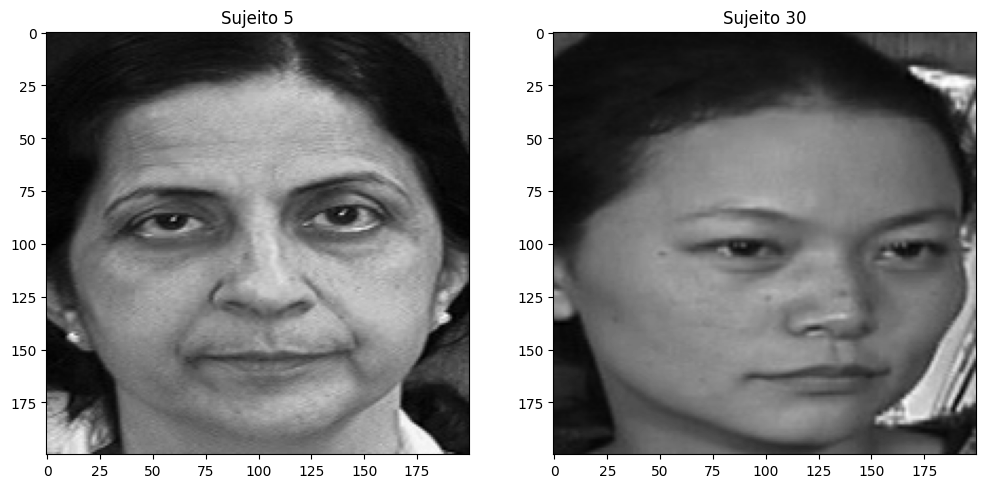

In [ ]:
plt.figure(figsize=(12, 10))
plt.subplot(121)
plt.title("Sujeito " + str(sujeitos_teste[11])) #inidice 11
plt.imshow(dados_teste[11], cmap = "gray")

plt.subplot(122)
plt.title("Sujeito " + str(sujeitos_teste[19])) #indice 19
plt.imshow(dados_teste[19], cmap = "gray")

plt.show()

In [ ]:
predicao_fisher = modelo_fisherfaces.predict(dados_teste[11]) #indice 11
predicao_fisher

(5, 1186.235887598202)

In [ ]:
predicao_fisher = modelo_fisherfaces.predict(dados_teste[19]) #inidice 19
predicao_fisher

(30, 1158.0525670545999)

- Esse modelo também se saiu bem ao acertar a classe do sujeito

#Algoritmo LPBH
- O algoritmo Local Binary Patterns Histogram (LBPH) funciona ao descrever a imagem facial em termos de padrões binários locais. Ele divide a imagem em pequenas regiões, compara cada pixel com seus vizinhos e cria um histograma das comparações, que é então usado para reconhecimento facial.
### Etapas de funcionamento:
- **Cálculo dos Padrões Binários Locais:**

  Para cada pixel, é comparado com os pixels vizinhos em uma janela (por exemplo, 3x3).

  Se o pixel central tem um valor maior que o vizinho, anota-se um '1', caso contrário, anota-se um '0'.

  Isso resulta em um número binário para cada pixel, que representa o padrão local.

- **Divisão em Regiões:** A imagem é dividida em várias pequenas regiões.
- **Cálculo do Histograma:** Para cada região, é calculado um histograma das ocorrências dos padrões binários.
- **Concatenação dos Histogramas:** Os histogramas de todas as regiões são concatenados para formar um vetor final que representa a imagem.
- **Reconhecimento Facial:** Para reconhecer uma nova imagem, seu vetor de histograma é comparado com os vetores das imagens de treinamento usando uma medida de distância, como a distância Euclidiana.

In [ ]:
modelo_lpbh = cv2.face.LBPHFaceRecognizer_create()

modelo_lpbh.train(dados_treinamento, sujeitos)

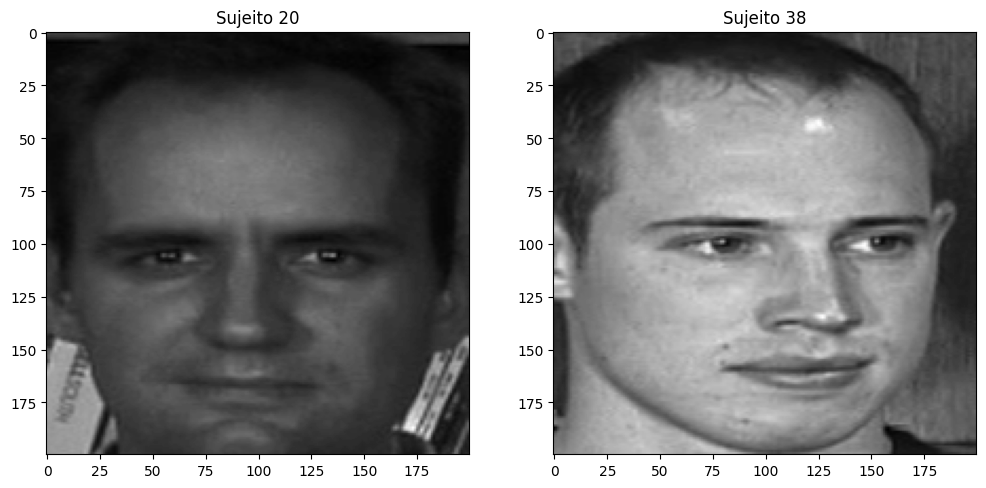

In [ ]:
plt.figure(figsize=(12, 10))
plt.subplot(121)
plt.title("Sujeito " + str(sujeitos_teste[24])) #inidice 24
plt.imshow(dados_teste[24], cmap = "gray")

plt.subplot(122)
plt.title("Sujeito " + str(sujeitos_teste[29])) #indice 29
plt.imshow(dados_teste[29], cmap = "gray")

plt.show()

In [ ]:
predicao_lpbh = modelo_lpbh.predict(dados_teste[24])
predicao_lpbh

(20, 28.919287637985523)

In [ ]:
predicao_lpbh = modelo_lpbh.predict(dados_teste[29])
predicao_lpbh

(38, 30.32862386628956)

- O modelo se saiu bem também

# Diferenças entre Eigenface, Fisherface e LBPH

## Eigenface

**Conceito**: Baseado em Análise de Componentes Principais (PCA).

**Características**:
- Extrai os componentes principais (eigenfaces) que representam as variações mais significativas nas imagens faciais.
- Reduz a dimensionalidade dos dados ao projetá-los em um espaço de menor dimensão.

**Vantagens**:
- Simples e eficiente em termos de cálculo.
- Funciona bem quando as condições de iluminação e expressões faciais são consistentes.

**Desvantagens**:
- Sensível a variações de iluminação e expressão facial.
- Pode não ser muito discriminativo quando há grandes variações entre as classes.

## Fisherface

**Conceito**: Baseado em Análise Discriminante Linear (LDA).

**Características**:
- Maximiza a separação entre classes ao minimizar a variabilidade dentro de cada classe.
- Usa PCA para reduzir a dimensionalidade inicialmente e depois aplica LDA.

**Vantagens**:
- Melhor discriminação entre diferentes pessoas comparado ao Eigenface.
- Funciona melhor em condições de iluminação variáveis e diferentes expressões faciais.

**Desvantagens**:
- Pode ser computacionalmente mais intensivo que o Eigenface.
- Requer um número significativo de imagens de treinamento por pessoa para ser eficaz.

## LBPH (Local Binary Patterns Histogram)

**Conceito**: Baseado em padrões binários locais de textura.

**Características**:
- Divide a imagem em pequenas regiões e compara cada pixel com seus vizinhos, criando um histograma de padrões binários.
- Foca em padrões locais de textura, em vez de componentes globais.

**Vantagens**:
- Muito robusto a variações de iluminação.
- Simples e rápido, adequado para aplicações em tempo real.
- Funciona bem com pequenas variações dentro da mesma classe.

**Desvantagens**:
- Pode não capturar bem as características globais da face.
- O desempenho pode ser afetado por ruídos e variações extremas na imagem.



#Precisão dos algoritmos

In [ ]:
from sklearn.metrics import accuracy_score

y_pred_eingen = []
y_pred_fisher = []
y_pred_lpbh = []

for item in dados_teste:
  y_pred_eingen.append(modelo_eingenfaces.predict(item)[0])
  y_pred_fisher.append(modelo_fisherfaces.predict(item)[0])
  y_pred_lpbh.append(modelo_lpbh.predict(item)[0])

In [ ]:
acc_eingen = accuracy_score(sujeitos_teste, y_pred_eingen)
acc_fisher = accuracy_score(sujeitos_teste, y_pred_fisher)
acc_lpbh = accuracy_score(sujeitos_teste, y_pred_lpbh)

print(f"Acurácia Modelo Eingen Faces:  {acc_eingen}, \nAcurácia Modelo Fisher Faces: {acc_fisher}, \nAcurácia Modelo LPBH: {acc_lpbh}")


Acurácia Modelo Eingen Faces:  0.724, 
Acurácia Modelo Fisher Faces: 0.52, 
Acurácia Modelo LPBH: 0.792


#DLib para detecção de marcos faciais

In [ ]:
imagem = cv2.imread("/content/drive/MyDrive/Alura/ML_Avançada/Visão Computacional/Arq_imagens/imagens/px-woman-smilings.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

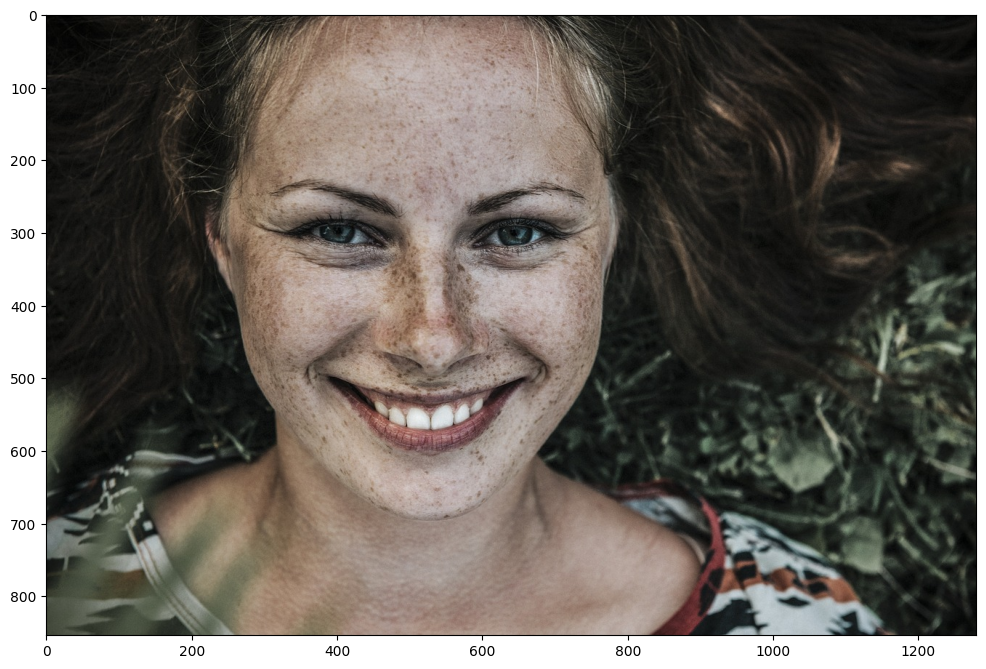

In [ ]:
plt.figure(figsize=(12, 10))
plt.imshow(imagem)

##Algoritmo Shape Predictor 68 Land Marks (DLIB)
- https://github.com/alura-cursos/alura-analise-facial/tree/aula_6/classificadores
- Esse modelo é amplamente utilizado para detectar e localizar 68 pontos específicos em um rosto humano, que correspondem a características faciais como olhos, sobrancelhas, nariz, boca e contorno do rosto. Esses pontos são úteis para várias aplicações de visão computacional, incluindo reconhecimento facial, análise de expressões faciais, filtros de realidade aumentada e muito mais.
###Funcionamento:
O modelo Shape Predictor 68 Land Marks é treinado em um grande conjunto de dados de imagens faciais anotadas. Ele utiliza uma técnica chamada Regressão em Conjunto de Gradientes (Gradient Boosting Regression) para prever a localização dos pontos de referência com alta precisão.

In [ ]:
classificador_dlib_68_path = "/content/drive/MyDrive/Alura/ML_Avançada/Visão Computacional/classificadores/shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_path)
detector_face = dlib.get_frontal_face_detector()

###Função para anotar retangulos nos rostos das pessoas

In [ ]:
def anotar_rosto(imagem):
  retangulos = detector_face(imagem, 1) #1 siginifica que a imagem não será redimensionada para detectar mais rostor

  if len(retangulos) == 0:
    return None
  for k, d in enumerate(retangulos): #d: valores para identificar o retangulo; k: delimita qual o retangulo
    print("Identificando rosto " + str(k))
    cv2.rectangle(imagem, (d.left(), d.top()), (d.right(), d.bottom()), (255, 255, 0), 2)

  return imagem

Identificando rosto 0


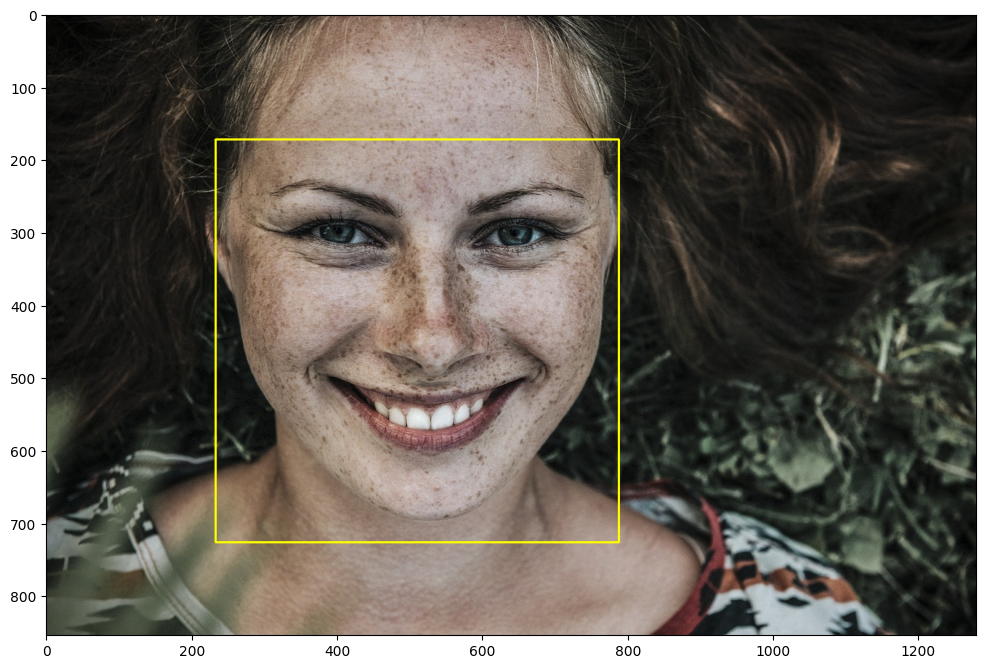

In [ ]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_rosto(imagem_anotada)

plt.figure(figsize=(12, 10))
plt.imshow(imagem_anotada)

### Processando os marcos faciais

In [ ]:
def pontos_marcos_faciais(imagem):
  retangulos = detector_face(imagem, 1)
  if len(retangulos) == 0:
    return None

  marcos = []
  for ret in retangulos:
    marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem,ret).parts()]))
    return marcos

In [ ]:
marcos_faciais = pontos_marcos_faciais(imagem)
len(marcos_faciais)

1

In [ ]:
len(marcos_faciais[0])

68

- 68 pontos de marcos faciais em um rosto

###Função para desenhar os marcos faciais por todo o rosto.

In [ ]:
def anotar_marcos_faciais(imagem, marcos):
  for marco in marcos:
    for idx, ponto in enumerate(marco):
      centro = (ponto[0, 0], ponto[0, 1]) #cooordenadas
      cv2.circle(imagem, centro, 3, (255, 255, 0), -1) #-1 pinta o circulo
      cv2.putText(imagem, str(idx), centro, cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
  return imagem

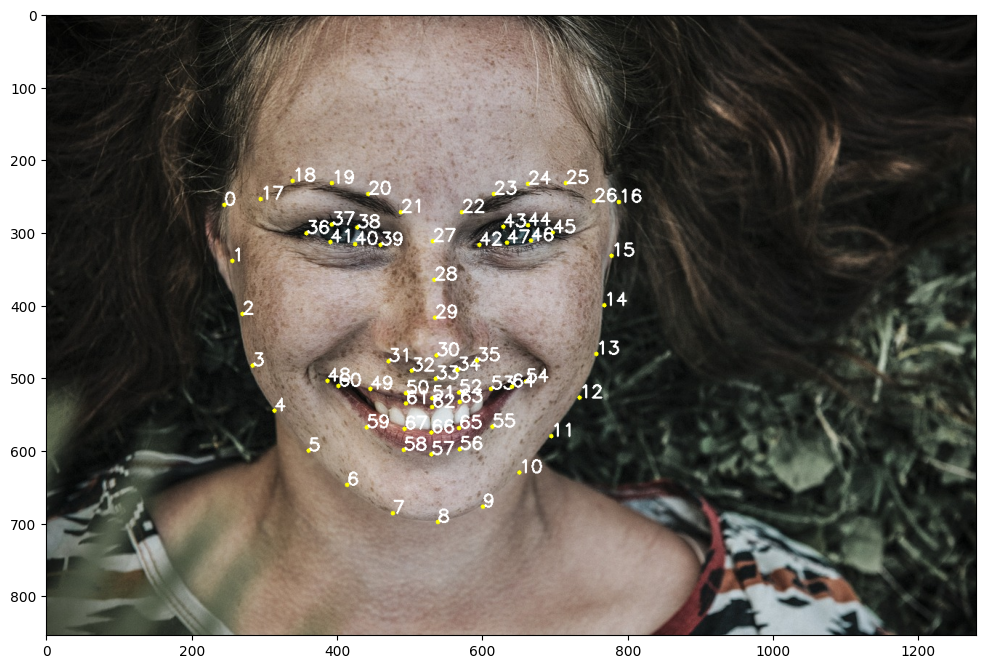

In [ ]:
imagem_anotada = imagem.copy() #copiando para nãop anotar na imagem original
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

plt.figure(figsize=(12, 10))
plt.imshow(imagem_anotada)

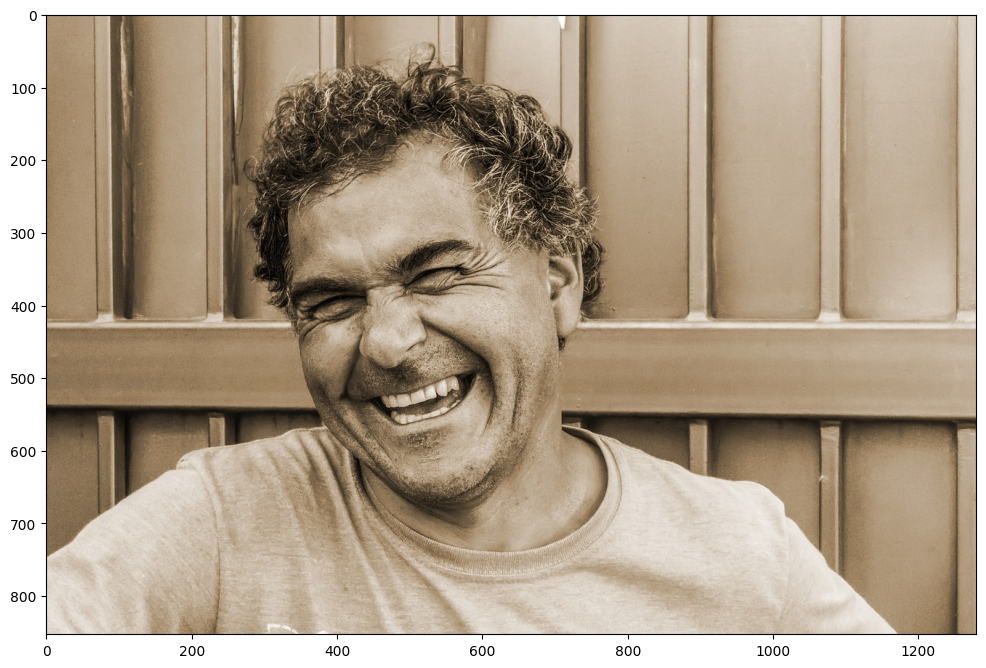

In [ ]:
imagem_pessoa = cv2.imread("/content/drive/MyDrive/Alura/ML_Avançada/Visão Computacional/Arq_imagens/imagens/px-man-happy.jpg")
imagem_pessoa = cv2.cvtColor(imagem_pessoa, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 10))
plt.imshow(imagem_pessoa)

Identificando rosto 0


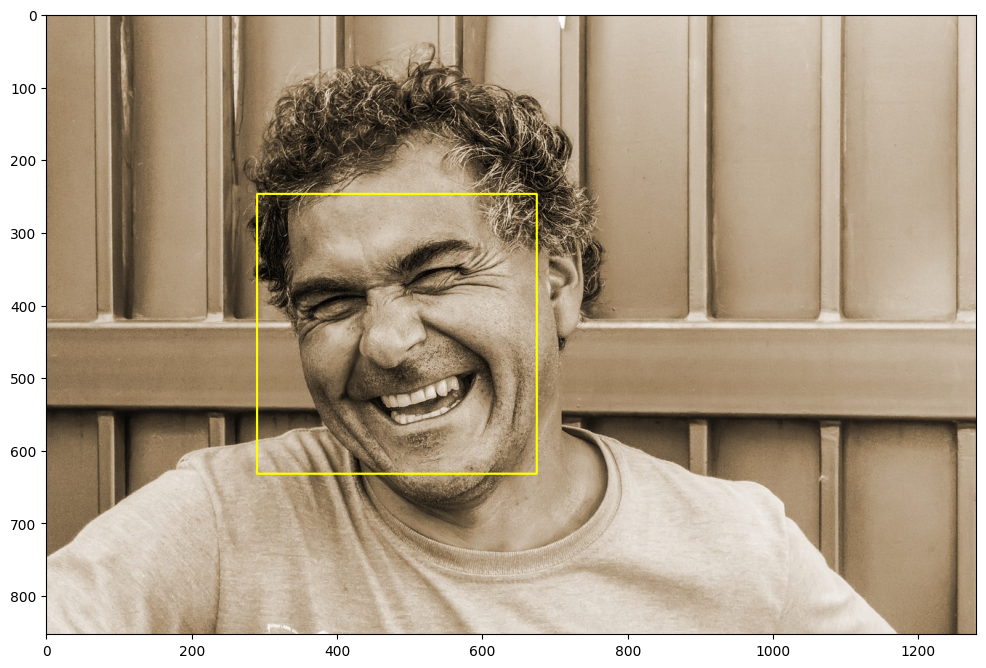

In [ ]:
imagem_anotada = imagem_pessoa.copy()
imagem_anotada = anotar_rosto(imagem_anotada)

plt.figure(figsize=(12, 10))
plt.imshow(imagem_anotada)

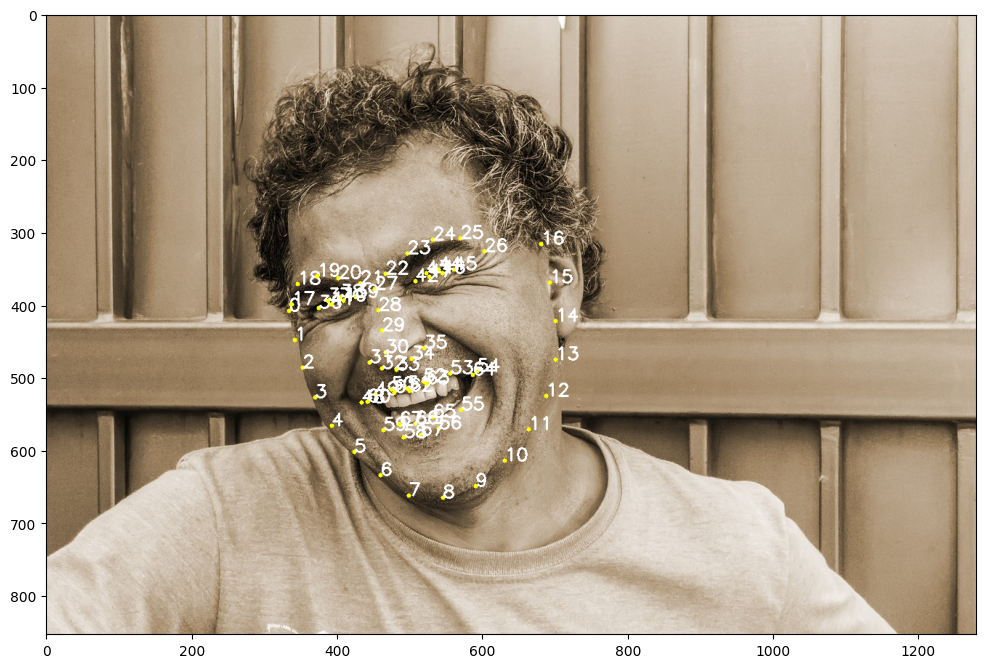

In [ ]:
imagem_anotada = imagem_pessoa.copy()
marcos_faciais = pontos_marcos_faciais(imagem_anotada)
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

plt.figure(figsize=(12, 10))
plt.imshow(imagem_anotada)

#Medidas de aspecto de razão:

##Conceito de Aspect Ratio
A Razão de Aspecto é definida como a razão entre a largura (width) e a altura (height) de um objeto. Matematicamente, é expressa como:

$ Aspect Ratio
=
largura / altura $
​


###Aplicações na Visão Computacional
- **Detecção de Faces:** A Razão de Aspecto é usada para validar regiões candidatas que podem conter faces. Por exemplo, rostos humanos geralmente têm uma razão de aspecto específica, e essa informação pode ajudar a filtrar regiões que não correspondem a essa proporção.

- **Rastreamento de Objetos:** Durante o rastreamento de objetos em vídeos, a Razão de Aspecto pode ser usada para garantir que o objeto rastreado mantenha proporções consistentes ao longo do tempo.

- **Análise de Formas:** Em análise de formas e reconhecimento de padrões, a Razão de Aspecto ajuda a distinguir entre diferentes tipos de objetos. Por exemplo, na detecção de veículos, a proporção largura-altura pode ser usada para diferenciar entre carros, caminhões e motocicletas.

- **Redimensionamento de Imagens:** Ao redimensionar imagens, a Razão de Aspecto é mantida para evitar distorções. Isso é crucial para garantir que a imagem redimensionada mantenha suas proporções originais.

- Os ranges onde cada parte de rosto se encontra

In [ ]:
FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
LABIO = list(range(48, 61))
SOMBRANCELHA_DIREITA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36, 42))
OLHO_ESQUERDO = list(range(42, 48))
NARIZ = list(range(27, 35))
MANDIBULA = list(range(0, 17))

In [ ]:
from scipy.spatial import distance as dist #calculo da distancia euclidiana

def aspecto_razao_olhos(pontos_olhos):
  a = dist.euclidean(pontos_olhos[1], pontos_olhos[5])
  b = dist.euclidean(pontos_olhos[2], pontos_olhos[4])
  c = dist.euclidean(pontos_olhos[0], pontos_olhos[3])

  aspecto_razao = (a + b)/(2.0 * c)
  return aspecto_razao

In [ ]:
def anotar_marcos_casca_convexa(imagem, marcos):
  retangulos = detector_face(imagem, 1)
  if len(retangulos) == 0:
    return None
  for idx, ret in enumerate(retangulos):
    marco = marcos[idx]

    pontos = cv2.convexHull(marco[OLHO_ESQUERDO])
    cv2.drawContours(imagem, [pontos], 0, (0, 255, 0), 2)
    pontos = cv2.convexHull(marco[OLHO_DIREITO])
    cv2.drawContours(imagem, [pontos], 0, (0, 255, 0), 2)
  return imagem

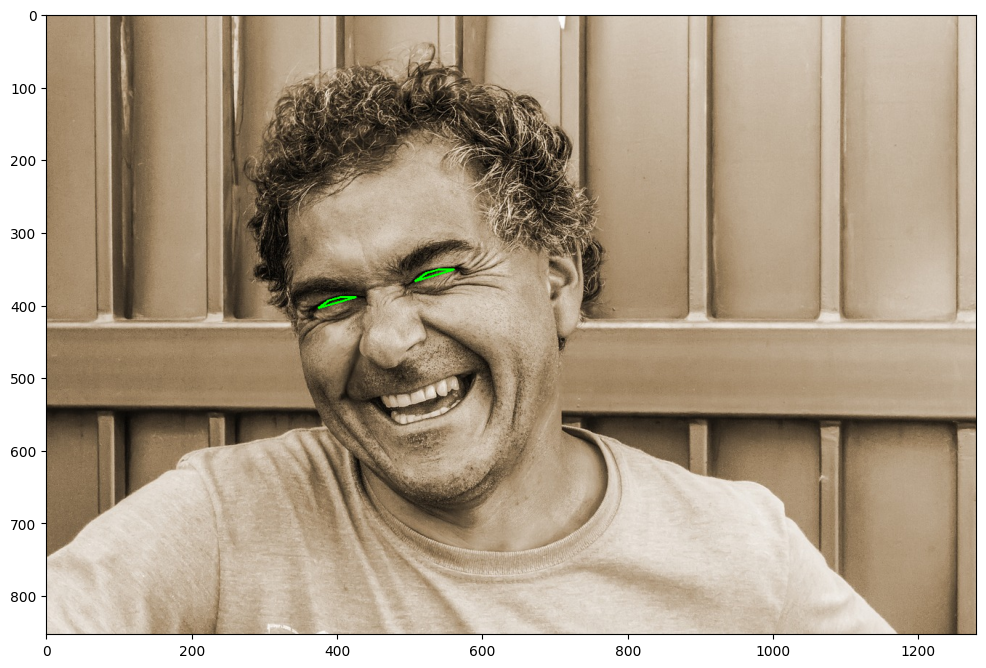

In [ ]:
imagem_anotada = imagem_pessoa.copy()
imagem_anotada = anotar_marcos_casca_convexa(imagem_anotada, marcos_faciais)

plt.figure(figsize=(12, 10))
plt.imshow(imagem_anotada)

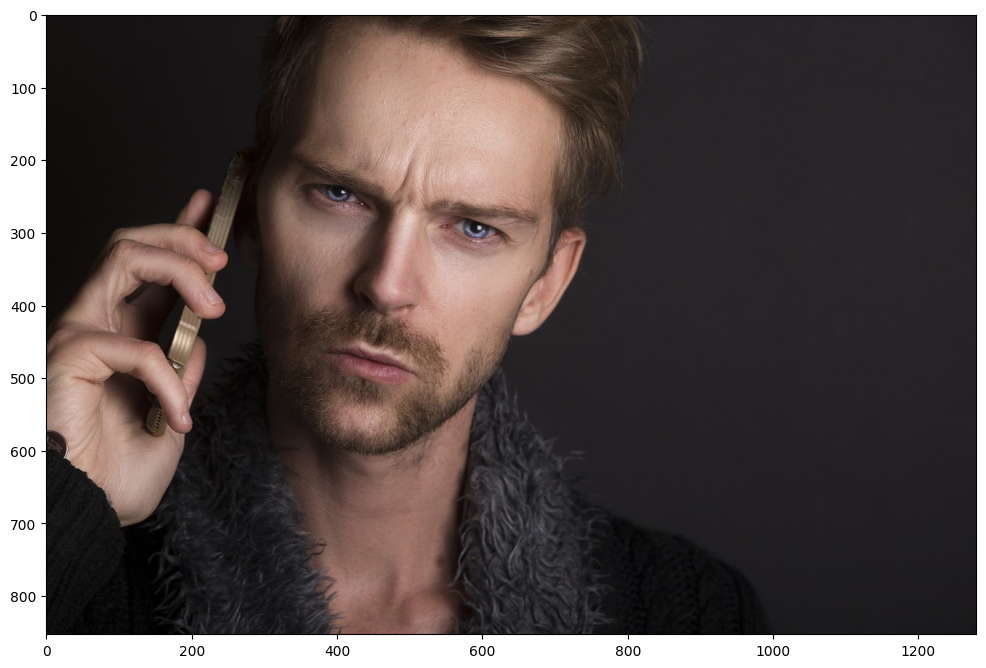

In [ ]:
imagem_pessoa_seria = cv2.imread("/content/drive/MyDrive/Alura/ML_Avançada/Visão Computacional/Arq_imagens/imagens/px-man-serious.jpg")
imagem_pessoa_seria = cv2.cvtColor(imagem_pessoa_seria, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 10))
plt.imshow(imagem_pessoa_seria)

In [ ]:
marcos_faciais = pontos_marcos_faciais(imagem_pessoa_seria)

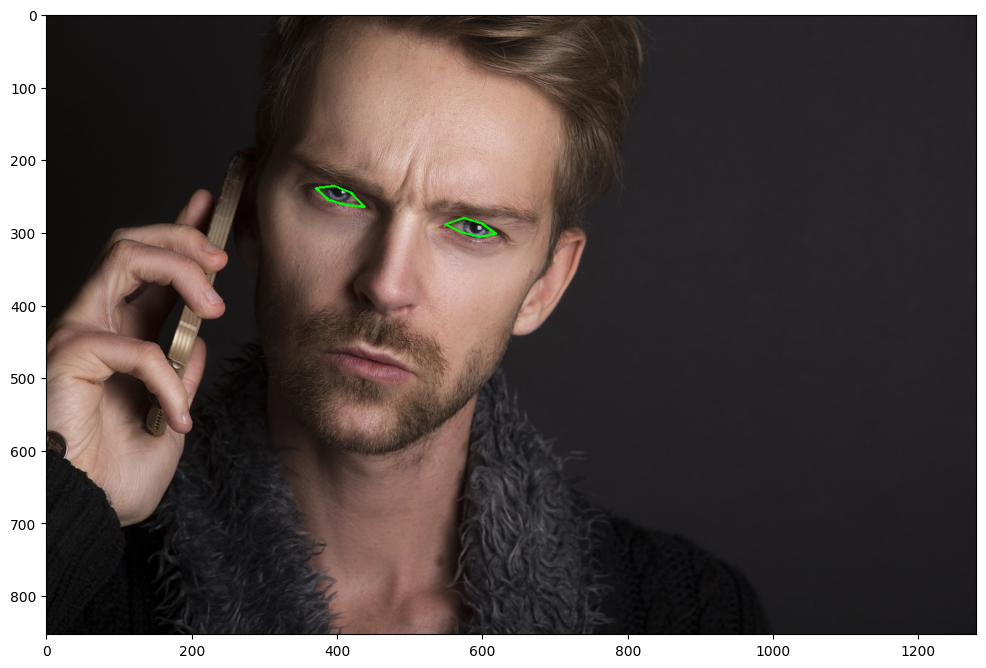

In [ ]:
imagem_anotada = imagem_pessoa_seria.copy()
imagem_anotada = anotar_marcos_casca_convexa(imagem_anotada, marcos_faciais)

plt.figure(figsize=(12, 10))
plt.imshow(imagem_anotada)